# Getting started with TinyTimeMixer (TTM)

This notebooke demonstrates the usage of a pre-trained `TinyTimeMixer` model for several multivariate time series forecasting tasks. For details related to model architecture, refer to the [TTM paper](https://arxiv.org/pdf/2401.03955.pdf).

In this example, we will use a pre-trained TTM-512-96 model. That means the TTM model can take an input of 512 time points (`context_length`), and can forecast upto 96 time points (`forecast_length`) in the future. We will use the pre-trained TTM in two settings:
1. **Zero-shot**: The pre-trained TTM will be directly used to evaluate on the `test` split of the target data. Note that the TTM was NOT pre-trained on the target data.
2. **Few-shot**: The pre-trained TTM will be quickly fine-tuned on only 5% of the `train` split of the target data, and subsequently, evaluated on the `test` part of the target data.

Note: Alternatively, this notebook can be modified to try the TTM-1024-96 model.

Pre-trained TTM models will be fetched from the [Hugging Face TTM Model Repository](https://huggingface.co/ibm/TTM).

## Installation

In [1]:
# Clone the ibm/tsfm
! git clone https://github.com/IBM/tsfm.git

fatal: destination path 'tsfm' already exists and is not an empty directory.


In [2]:
# Change directory. Move inside the tsfm repo.
%cd tsfm

c:\Users\Noor1\Documents\omar\forecast\tsfm


c:\Users\Noor1\Documents\omar\forecast\.venv\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [3]:
# Do ls
! ls

'ls' is not recognized as an internal or external command,
operable program or batch file.


In [4]:
# Install the tsfm library
# ! pip install ".[notebooks]"

^C


## Imports

In [1]:
# Standard
import os
import math
import tempfile
import torch

# Third Party
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from transformers import EarlyStoppingCallback, Trainer, TrainingArguments, set_seed
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# First Party
from tsfm_public.models.tinytimemixer.utils import (
    count_parameters,
    plot_preds,
)

# Local
from tsfm_public.models.tinytimemixer import TinyTimeMixerForPrediction
from tsfm_public.toolkit.callbacks import TrackingCallback

## Important arguments

In [177]:
# Set seed for reproducibility
SEED = 42
set_seed(SEED)

# DATA ROOT PATH
# Make sure to download the target data (here ettm2) on the `DATA_ROOT_PATH` folder.
# ETT is available at: https://github.com/zhouhaoyi/ETDataset/tree/main
target_dataset = "ettm2"
DATA_ROOT_PATH = "https://raw.githubusercontent.com/zhouhaoyi/ETDataset/main/ETT-small/ETTm2.csv"
DATA_ROOT_PATH = "/content/sample_data.csv"
# Results dir
OUT_DIR = "ttm_finetuned_models/"

# TTM model branch
# Use main for 512-96 model
# Use "1024_96_v1" for 1024-96 model
TTM_MODEL_REVISION = "main"

# Forecasting parameters
context_length = 512
forecast_length = 1
fewshot_fraction = 1

## Data processing pipeline

In [235]:
def get_sampling_data(filename: str, activation_electrode_no: int, readout_electrode_no: int):
    data = np.loadtxt(filename)
    inputs = data[:, :activation_electrode_no]
    outputs = data[:, -readout_electrode_no:]
    return inputs, outputs

def load_and_process_data(data_dir: str, activation_electrode_no: int, readout_electrode_no: int, filename='IO.dat') -> pd.DataFrame:
    # Load the raw data
    inputs, outputs = get_sampling_data(f"{data_dir}/{filename}", activation_electrode_no, readout_electrode_no)
    
    # Convert to pandas DataFrame
    df_inputs = pd.DataFrame(inputs, columns=[f'input_{i}' for i in range(activation_electrode_no)])
    df_outputs = pd.DataFrame(outputs, columns=[f'output_{i}' for i in range(readout_electrode_no)])
    
    # Combine inputs and outputs into one DataFrame
    df = pd.concat([df_inputs, df_outputs], axis=1)
    
    # Add additional columns required by TimeSeriesDataSet
    df['time_idx'] = np.arange(len(df))  # Assuming the data is sequential
    df['group_id'] = 0  # Assuming a single time series for simplicity
    
    return df

# Visualize the input and output series
def plot_time_series(df, activation_electrode_no, readout_electrode_no):
    fig, axs = plt.subplots(2, 1, figsize=(15, 10))
    
    # Plot inputs
    for i in range(activation_electrode_no):
        axs[0].plot(df['time_idx'], df[f'input_{i}'], label=f'Series {i}')
    axs[0].legend(loc='upper right')
    axs[0].set_title('Input Series')
    
    # Plot outputs
    for i in range(readout_electrode_no):
        axs[1].plot(df['time_idx'], df[f'output_{i}'], label=f'Output {i}', color='r')
    axs[1].legend(loc='upper right')
    axs[1].set_title('Output Series')
    
    plt.tight_layout()
    plt.show()


# Example usage:
data_dir = r"C:\Users\Noor1\Documents\omar\forecast\Files_BSC_thesis"
activation_electrode_no = 7
readout_electrode_no = 1
df = load_and_process_data(data_dir, activation_electrode_no, readout_electrode_no, filename='IO.dat')
print(f'Size of the Dataframe: {df.shape}')

Size of the Dataframe: (25000000, 10)


In [236]:
df.tail(10)

,input_0,input_1,input_2,input_3,input_4,input_5,input_6,output_0,time_idx,group_id
24999990,0.668432,0.749878,-0.672641,-0.749409,-0.249914,-0.146195,0.319336,0.211721,24999990,0
24999991,0.665383,0.749687,-0.677235,-0.748811,-0.249998,-0.151399,0.300633,0.211753,24999991,0
24999992,0.662282,0.749406,-0.681696,-0.748005,-0.249954,-0.156501,0.281704,0.212028,24999992,0
24999993,0.659128,0.749037,-0.686022,-0.746993,-0.249782,-0.161499,0.262564,0.212352,24999993,0
24999994,0.655923,0.748580,-0.690213,-0.745775,-0.249481,-0.166388,0.243227,0.212691,24999994,0
24999995,0.652665,0.748033,-0.694267,-0.744350,-0.249053,-0.171165,0.223708,0.213015,24999995,0
24999996,0.649356,0.747398,-0.698185,-0.742720,-0.248496,-0.175828,0.204021,0.213338,24999996,0
24999997,0.645996,0.746675,-0.701964,-0.740884,-0.247812,-0.180372,0.184180,0.213403,24999997,0
24999998,0.642585,0.745863,-0.705605,-0.738844,-0.247001,-0.184796,0.164202,0.213694,24999998,0
24999999,0.639123,0.744962,-0.709107,-0.736600,-0.246063,-0.189095,0.144100,0.213694,24999999,0


In [237]:
# save the dataframe df as a csv file
# df.to_csv('full_data.csv', index=False)

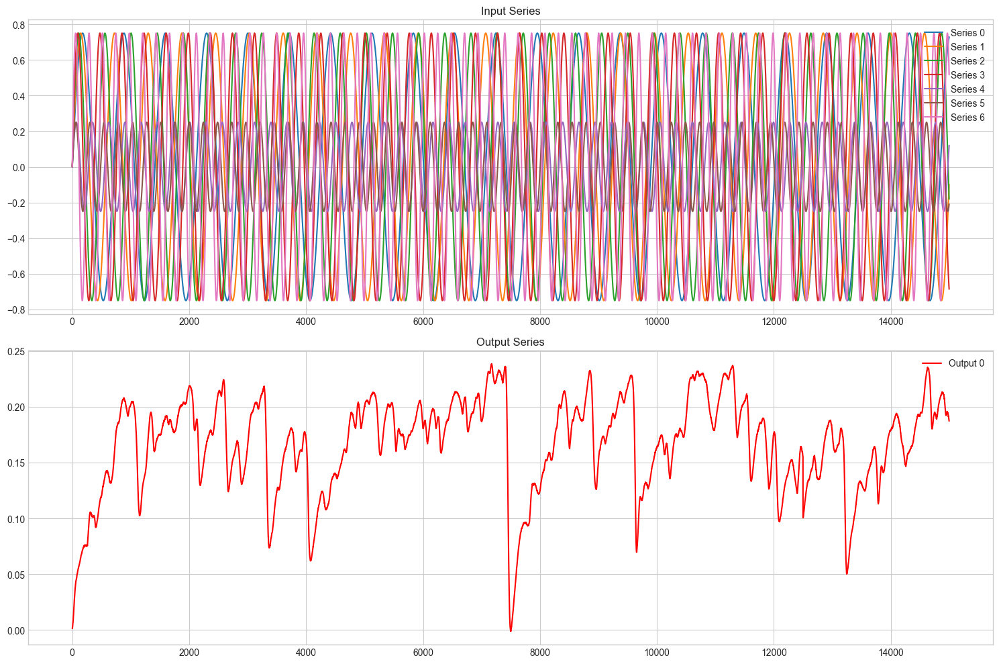

In [238]:
# Plot the sample
plot_time_series(df.head(15000), activation_electrode_no, readout_electrode_no)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot the original time series
plt.figure(figsize=(14, 7))
plt.plot(df['output_0'], label='Time Series Data')
plt.title('Time Series Data')
plt.xlabel('Date')
plt.ylabel('Output_0')
plt.legend()
plt.show()

# Decompose the time series
result = seasonal_decompose(df['output_0'], model='additive', period=365)
result.plot()
plt.show()

# Check for stationarity
adf_result = adfuller(df['output_0'])
print(f'ADF Statistic: {adf_result[0]}')
print(f'p-value: {adf_result[1]}')

for key, value in adf_result[4].items():
    print(f'Critical Value {key}: {value}')

# Plot ACF and PACF
plt.figure(figsize=(14, 7))
plt.subplot(211)
plot_acf(df['output_0'], lags=50, ax=plt.gca())
plt.subplot(212)
plot_pacf(df['output_0'], lags=50, ax=plt.gca())
plt.show()

# Plot trend component
trend = result.trend.dropna()
plt.figure(figsize=(14, 7))
plt.plot(trend, label='Trend')
plt.title('Trend Component')
plt.xlabel('Date')
plt.ylabel('Output_0')
plt.legend()
plt.show()

# Plot seasonal component
seasonal = result.seasonal.dropna()
plt.figure(figsize=(14, 7))
plt.plot(seasonal, label='Seasonality')
plt.title('Seasonal Component')
plt.xlabel('Date')
plt.ylabel('Output_0')
plt.legend()
plt.show()

# Plot residual component
residual = result.resid.dropna()
plt.figure(figsize=(14, 7))
plt.plot(residual, label='Residuals')
plt.title('Residual Component')
plt.xlabel('Date')
plt.ylabel('Output_0')
plt.legend()
plt.show()

In [107]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(x=df['output_0'], lags=50)
plt.show()

In [239]:
data = df[:2500000]

data.shape

(2500000, 10)

In [240]:
def min_max_normalize(df, feature_columns, target_column):
    df_normalized = df.copy()
    for column in feature_columns + [target_column]:
        min_val = df[column].min()
        max_val = df[column].max()
        df_normalized[column] = (df[column] - min_val) / (max_val - min_val)
    return df_normalized

# Example usage
feature_columns = [f'input_{i}' for i in range(7)]
target_column = 'output_0'
data_normalized = min_max_normalize(data, feature_columns, target_column)
print(data_normalized.head())

    input_0   input_1   input_2   input_3   input_4   input_5   input_6  \
0  0.500000  0.500000  0.500000  0.500000  0.500000  0.500000  0.500000   
1  0.504443  0.505441  0.507025  0.508311  0.511326  0.512952  0.513692   
2  0.508885  0.510882  0.514048  0.516621  0.522647  0.525895  0.527374   
3  0.513327  0.516321  0.521068  0.524925  0.533955  0.538820  0.541035   
4  0.517768  0.521759  0.528084  0.533223  0.545247  0.551720  0.554666   

   output_0  time_idx  group_id  
0  0.249245         0         0  
1  0.249563         1         0  
2  0.249881         2         0  
3  0.250305         3         0  
4  0.250914         4         0  


In [241]:
data_normalized.shape

(2500000, 10)

In [242]:
from tsfm_public.toolkit.time_series_preprocessor import TimeSeriesPreprocessor

dataset_path = DATA_ROOT_PATH
timestamp_column = "time_idx"
id_columns = []
# id_columns = ["input_0", "input_1", "input_2", "input_3", "input_4", "input_5", "input_6", "output_0"]
observable_columns = ["input_0", "input_1", "input_2", "input_3", "input_4", "input_5", "input_6"]
target_columns = ['output_0']
# control_columns =
# split_config = {
#                 "train": [0, 12 * 30 * 24 * 4],
#                 "valid": [12 * 30 * 24 * 4, 12 * 30 * 24 * 4 + 4 * 30 * 24 * 4],
#                 "test": [
#                     12 * 30 * 24 * 4 + 4 * 30 * 24 * 4,
#                     12 * 30 * 24 * 4 + 8 * 30 * 24 * 4,
#                 ],
#             }

end_train = int(data_normalized.shape[0] * 0.8)
end_valid = int(data_normalized.shape[0] * 0.9)
split_config = {
                "train": [0, end_train],
                "valid": [end_train, end_valid],
                "test": [end_valid, data_normalized.shape[0]],
            }

# split_config = {
#                 "train": [0, 10],
#                 "valid": [10, 20],
#                 "test": [20, data_normalized.shape[0]],
#             }
# split_config = {
#                 "train": [0,int(data_normalized.shape[0] * 0.8)],
#                 "valid": [160000, 180000],
#                 "test": [180000, 200000],
#             }
# Understanding the split config -- slides

# data = pd.read_csv(
#     dataset_path,
#     # parse_dates=[timestamp_column],
# )


column_specifiers = {
    "timestamp_column": timestamp_column,
    "id_columns": id_columns,
    "target_columns": target_columns,
    "observable_colums": observable_columns,
    "control_columns": [],
}

tsp = TimeSeriesPreprocessor(
    **column_specifiers,
    context_length=context_length,
    prediction_length=forecast_length,
    scaling=True,
    encode_categorical=False,
    scaler_type="minmax",
)

# train_dataset, valid_dataset, test_dataset = tsp.get_datasets(
#     data_normalized, split_config, fewshot_fraction=fewshot_fraction, fewshot_location="first"
# )

train_dataset, valid_dataset, test_dataset = tsp.get_datasets(
    data_normalized, split_config
)

# concatenate the train_dataset, valid_dataset, and test_dataset as they are pytorch datasets correctly
full_dataset = torch.utils.data.ConcatDataset([train_dataset, valid_dataset, test_dataset])
print(f"Data length: full = {len(full_dataset)}")

print(f"Data lengths: train = {len(train_dataset)}, val = {len(valid_dataset)}, test = {len(test_dataset)}")

C:\Users\Noor1\AppData\Local\Temp\ipykernel_26068\2862091021.py:66: DeprecationWarning: Call to deprecated method get_datasets. (Please use the standalone function `get_datasets()`.) -- Deprecated since version 0.1.1.
  train_dataset, valid_dataset, test_dataset = tsp.get_datasets(


Data length: full = 2499488
Data lengths: train = 1999488, val = 250000, test = 250000


In [161]:
full_dataset[0]

{'past_values': tensor([[0.7769],
         [0.7795],
         [0.7780],
         [0.7755],
         [0.7771],
         [0.7767],
         [0.7751],
         [0.7727],
         [0.7716],
         [0.7709],
         [0.7709],
         [0.7701],
         [0.7670],
         [0.7667],
         [0.7650],
         [0.7629],
         [0.7601],
         [0.7602],
         [0.7593],
         [0.7565],
         [0.7530],
         [0.7505],
         [0.7490],
         [0.7473],
         [0.7443],
         [0.7429],
         [0.7428],
         [0.7402],
         [0.7372],
         [0.7338],
         [0.7322],
         [0.7315],
         [0.7291],
         [0.7266],
         [0.7230],
         [0.7190],
         [0.7163],
         [0.7140],
         [0.7156],
         [0.7125],
         [0.7097],
         [0.7071],
         [0.7050],
         [0.7026],
         [0.7011],
         [0.6994],
         [0.6982],
         [0.6952],
         [0.6962],
         [0.6966],
         [0.6946],
         [0.6925

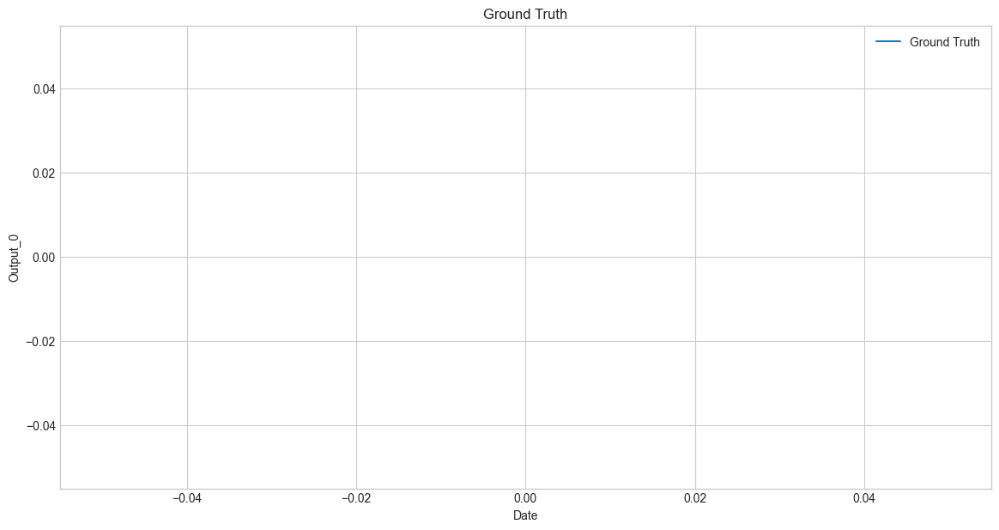

In [162]:
# just plot the output 0 column of the dataframe and enable a start and stop index to plot
def plot_ground_truth(data, start_idx, plot_length=2000):
    plt.figure(figsize=(14, 7))
    plt.plot(data['output_0'][start_idx:start_idx + plot_length], label='Ground Truth')
    plt.title('Ground Truth')
    plt.xlabel('Date')
    plt.ylabel('Output_0')
    plt.legend()
    plt.show()



plot_ground_truth(data, 990000 , 1000000)

## Zero-shot evaluation method

In [243]:
zeroshot_model = TinyTimeMixerForPrediction.from_pretrained("ibm/TTM", revision=TTM_MODEL_REVISION, loss='mse', prediction_filter_length=forecast_length)
zeroshot_model

TinyTimeMixerForPrediction(
  (backbone): TinyTimeMixerModel(
    (encoder): TinyTimeMixerEncoder(
      (patcher): Linear(in_features=64, out_features=192, bias=True)
      (mlp_mixer_encoder): TinyTimeMixerBlock(
        (mixers): ModuleList(
          (0): TinyTimeMixerAdaptivePatchingBlock(
            (mixer_layers): ModuleList(
              (0-1): 2 x TinyTimeMixerLayer(
                (patch_mixer): PatchMixerBlock(
                  (norm): TinyTimeMixerNormLayer(
                    (norm): LayerNorm((48,), eps=1e-05, elementwise_affine=True)
                  )
                  (mlp): TinyTimeMixerMLP(
                    (fc1): Linear(in_features=32, out_features=64, bias=True)
                    (dropout1): Dropout(p=0.2, inplace=False)
                    (fc2): Linear(in_features=64, out_features=32, bias=True)
                    (dropout2): Dropout(p=0.2, inplace=False)
                  )
                  (gating_block): TinyTimeMixerGatedAttention(
              

In [244]:
# save model as pt file
# torch.save(zeroshot_model, r"C:\Users\Noor1\Documents\omar\forecast\zeroshot_training_data.pt")

In [245]:
# temp_dir = tempfile.mkdtemp()
ouput_dir = "output/ttm"
# zeroshot_trainer
zeroshot_trainer = Trainer(
    model=zeroshot_model,
    args=TrainingArguments(
        output_dir=ouput_dir,
        per_device_eval_batch_size=64,
    )
)

In [165]:
zeroshot_trainer.evaluate(full_dataset)

  0%|          | 0/149 [00:00<?, ?it/s]

{'eval_loss': 0.00011264676140854135,
 'eval_runtime': 3.1713,
 'eval_samples_per_second': 2990.878,
 'eval_steps_per_second': 46.984}

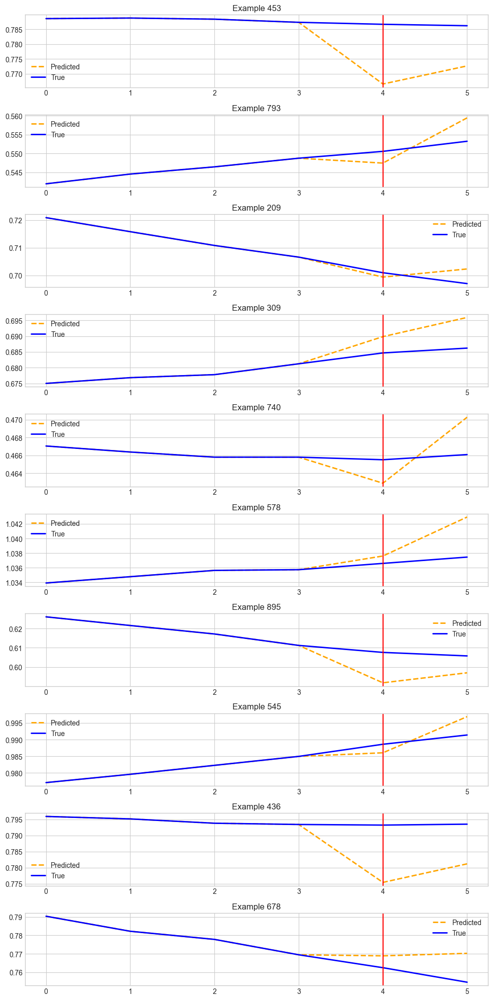

In [166]:
# plot
plot_preds(trainer=zeroshot_trainer, dset=test_dataset, plot_dir=os.path.join(OUT_DIR, "ettm2"), plot_prefix="test_zeroshot", channel=0)

In [246]:
import torch
from tqdm import tqdm

def calculate_predictions(trainer, dataset, start=0, end=200, amplification=1.0):
    """
    Calculate predictions and true values for a given dataset within a specified range.
    
    Args:
    trainer (Trainer): The Hugging Face Trainer instance with the trained model.
    dataset (ForecastDFDataset): The ForecastDFDataset containing the time series data.
    start (int): The starting index for calculating predictions. Default is 0.
    end (int): The ending index for calculating predictions. Default is 200.
    amplification (float): Amplification factor applied to the data. Default is 1.0.
    
    Returns:
    (np.array, np.array): Tuple of true values and predicted values.
    """
    device = torch.cuda.current_device() if torch.cuda.is_available() else torch.device("cpu")
    
    all_targets = []
    all_predictions = []
    
    with torch.no_grad():
        trainer.model.eval()
        trainer.model.to(device)
        
        for i in tqdm(range(start, min(end, len(dataset)))):
            batch = dataset[i]
            inputs = batch["past_values"].unsqueeze(0).to(device)
            targets = batch["future_values"].unsqueeze(0).to(device)
            
            # Get the model's predictions
            output = trainer.model(inputs)
            predictions = output.prediction_outputs  # Assuming the predictions are in prediction_outputs attribute
            
            all_targets.append(amplification * targets.squeeze(0))
            all_predictions.append(amplification * predictions.squeeze(0))
    
    all_targets = torch.cat(all_targets, dim=0).cpu().numpy()
    all_predictions = torch.cat(all_predictions, dim=0).cpu().numpy()
    
    return all_targets, all_predictions


In [249]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_predictions(true_values, predicted_values, plot_dir, plot_prefix="valid", channel=0, start=0, end=200):
    """
    Plot the true values and predicted values for a time series dataset within a specified range.
    
    Args:
    true_values (np.array): Array of true values.
    predicted_values (np.array): Array of predicted values.
    plot_dir (str): Directory to save the plot.
    plot_prefix (str): Prefix for the plot file name.
    channel (int): The channel to visualize. Default is 0.
    start (int): The starting index for plotting. Default is 0.
    end (int): The ending index for plotting. Default is 200.
    """
    # Ensure the end index does not exceed the length of the dataset
    end = min(end, len(true_values))
    
    # Check the dimensions and adjust if necessary
    if true_values.ndim == 1:
        y_true_flat = true_values[start:end]
        y_pred_flat = predicted_values[start:end]
    elif true_values.ndim == 2 and true_values.shape[1] > channel:
        y_true_flat = true_values[start:end, channel].flatten()
        y_pred_flat = predicted_values[start:end, channel].flatten()
    else:
        raise IndexError(f"Channel index {channel} is out of bounds for axis 1 with size {true_values.shape[1]}")
    
    # Create a single plot
    plt.figure(figsize=(14, 7))
    
    # Plot true values
    plt.plot(y_true_flat, label="True", linestyle="-", color="blue", linewidth=2)
    
    # Plot predicted values
    plt.plot(y_pred_flat, label="Predicted", linestyle="--", color="orange", linewidth=2)
    
    # Add labels and title
    plt.xlabel('Time')
    plt.ylabel('Output')
    plt.title('Real vs Predicted Outputs')
    plt.legend()
    
    # Save the plot
    plot_filename = f"{plot_prefix}_pred_vs_true_ch_{str(channel)}_range_{start}_{end}.pdf"
    os.makedirs(plot_dir, exist_ok=True)
    plt.savefig(os.path.join(plot_dir, plot_filename))
    plt.show()


In [250]:
import plotly.graph_objects as go
import numpy as np
import os

def plot_predictions_plotly(true_values, predicted_values, plot_dir, plot_prefix="valid", channel=0, start=0, end=200):
    """
    Plot the true values and predicted values for a time series dataset within a specified range using Plotly.
    
    Args:
    true_values (np.array): Array of true values.
    predicted_values (np.array): Array of predicted values.
    plot_dir (str): Directory to save the plot.
    plot_prefix (str): Prefix for the plot file name.
    channel (int): The channel to visualize. Default is 0.
    start (int): The starting index for plotting. Default is 0.
    end (int): The ending index for plotting. Default is 200.
    """
    # Ensure the end index does not exceed the length of the dataset
    end = min(end, len(true_values))
    
    # Check the dimensions and adjust if necessary
    if true_values.ndim == 1:
        y_true_flat = true_values[start:end]
        y_pred_flat = predicted_values[start:end]
    elif true_values.ndim == 2 and true_values.shape[1] > channel:
        y_true_flat = true_values[start:end, channel].flatten()
        y_pred_flat = predicted_values[start:end, channel].flatten()
    else:
        raise IndexError(f"Channel index {channel} is out of bounds for axis 1 with size {true_values.shape[1]}")
    
    # Create a Plotly figure
    fig = go.Figure()

    # Add true values trace
    fig.add_trace(go.Scatter(
        y=y_true_flat,
        mode='lines',
        name='True',
        line=dict(color='blue')
    ))

    # Add predicted values trace
    fig.add_trace(go.Scatter(
        y=y_pred_flat,
        mode='lines',
        name='Predicted',
        line=dict(color='orange', dash='dash')
    ))

    # Update layout
    fig.update_layout(
        title='Test Set: Real vs Predicted Outputs',
        xaxis_title='Time',
        yaxis_title='Output',
        legend=dict(x=0, y=1),
        margin=dict(l=0, r=0, t=40, b=0)
    )

    # Save the plot
    plot_filename = f"{plot_prefix}_pred_vs_true_ch_{str(channel)}_range_{start}_{end}.html"
    os.makedirs(plot_dir, exist_ok=True)
    fig.write_html(os.path.join(plot_dir, plot_filename))

    # Show plot
    fig.show()

In [192]:
start_index = 0
end_index = len(full_dataset)

true_values, predicted_values = calculate_predictions(
    trainer=zeroshot_trainer, 
    dataset=full_dataset, 
    start=start_index, 
    end=end_index, 
    amplification=1.0
)


100%|██████████| 9488/9488 [01:08<00:00, 139.12it/s]


In [199]:
true_values = true_values.flatten()  # For NumPy arrays
predicted_values = predicted_values.flatten()  # For NumPy arrays

In [200]:
true_values.shape, predicted_values.shape
# print(true_values.shape)  # For NumPy arrays
# print(len(true_values))  # For lists
# print(predicted_values.shape)  # For NumPy arrays
# print(len(predicted_values))  # For lists

((9488,), (9488,))

In [201]:
# combine the true_values and predicted_values into a single dataframe
df_down = pd.DataFrame({'true_values': true_values, 'predicted_values': predicted_values})
df_down.to_csv('zeroshot_true_vs_predicted_10kV2.csv', index=False)

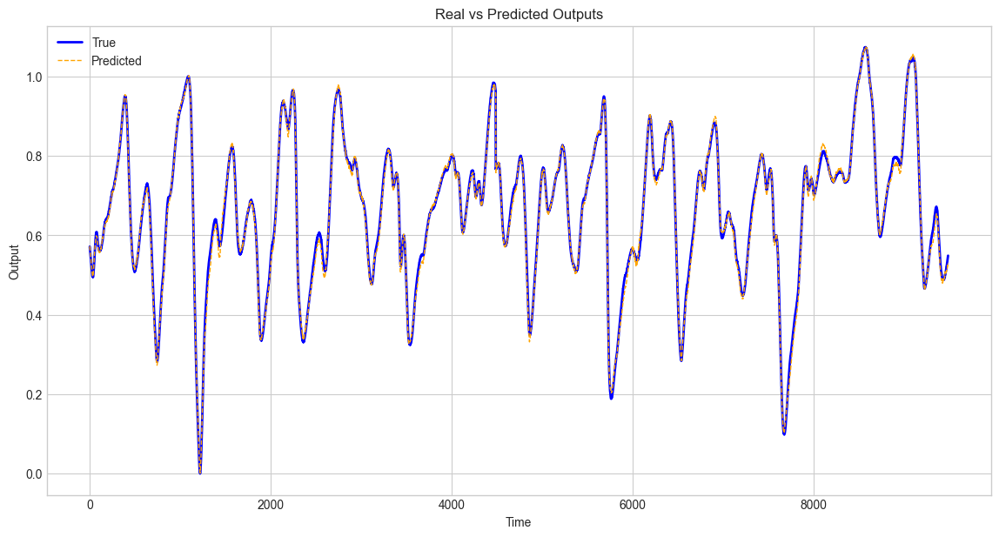

In [198]:
# plot the time series of df_downs
plot_predictions(true_values, predicted_values, plot_dir="output/ttm", plot_prefix="zeroshot", channel=0, start=0, end=20000)

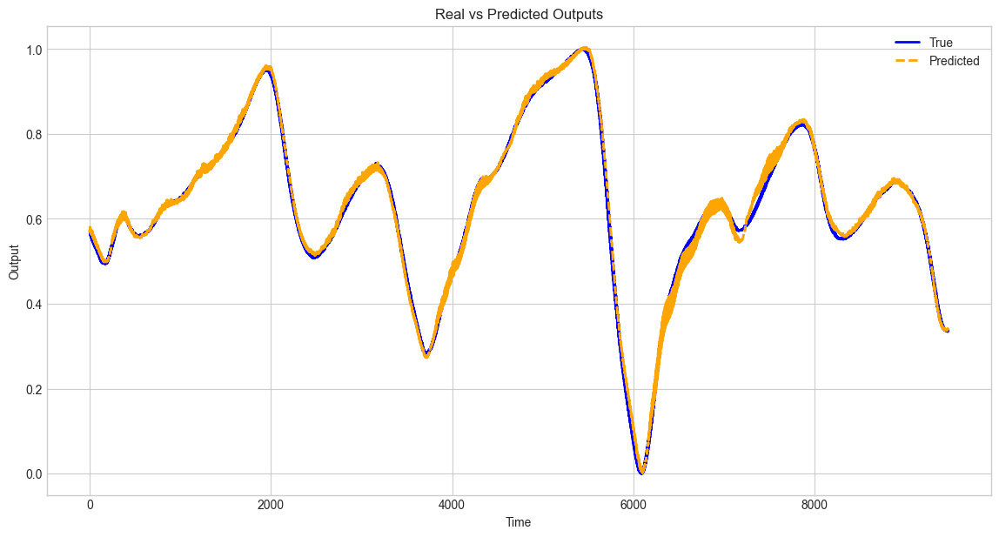

In [111]:
plot_predictions(
    true_values=true_values, 
    predicted_values=predicted_values, 
    plot_dir=os.path.join(OUT_DIR, "ettm2"), 
    plot_prefix="test_zeroshot", 
    channel=0, 
    start=start_index, 
    end=end_index
)


In [92]:
plot_predictions_plotly(
    true_values=true_values, 
    predicted_values=predicted_values, 
    plot_dir=os.path.join(OUT_DIR, "ettm2"), 
    plot_prefix="test_zeroshot", 
    channel=0, 
    start=start_index, 
    end=end_index
)

In [25]:
# import os
# import numpy as np
# import torch
# import matplotlib.pyplot as plt
# from tqdm import tqdm

# def plot_preds_with_limit(trainer, dataset, plot_dir, plot_prefix="valid", channel=0, truncate_history=True, limit=200, amplification=1.0):
#     """
#     Plots the predictions and actual values for a time series dataset up to a certain time window n.
    
#     Args:
#     trainer (Trainer): The Hugging Face Trainer instance with the trained model.
#     dataset (ForecastDFDataset): The ForecastDFDataset containing the time series data.
#     plot_dir (str): Directory to save the plot.
#     plot_prefix (str): Prefix for the plot file name.
#     channel (int): The channel to visualize. Default is 0.
#     truncate_history (bool): Whether to truncate history. Default is True.
#     limit (int): The number of time steps to visualize. Default is 200.
#     amplification (float): Amplification factor applied to the data. Default is 1.0.
#     """
#     device = torch.cuda.current_device() if torch.cuda.is_available() else torch.device("cpu")
    
#     all_targets = []
#     all_predictions = []
    
#     # Process the dataset
#     with torch.no_grad():
#         trainer.model.eval()
#         trainer.model.to(device)
        
#         for i in tqdm(range(min(limit, len(dataset)))):
#             batch = dataset[i]
#             inputs = batch["past_values"].unsqueeze(0).to(device)
#             targets = batch["future_values"].unsqueeze(0).to(device)
            
#             # Get the model's predictions
#             output = trainer.model(inputs)
#             predictions = output.prediction_outputs  # Assuming the predictions are in prediction_outputs attribute
            
#             all_targets.append(amplification * targets.squeeze(0))
#             all_predictions.append(amplification * predictions.squeeze(0))
    
#     all_targets = torch.cat(all_targets, dim=0).cpu().numpy()
#     all_predictions = torch.cat(all_predictions, dim=0).cpu().numpy()
    
#     print(f"all_targets shape: {all_targets.shape}")
#     print(f"all_predictions shape: {all_predictions.shape}")

#     # Ensure the time window does not exceed the length of the dataset
#     n = min(limit, len(all_targets))
    
#     # Check the dimensions and adjust if necessary
#     if all_targets.ndim == 1:
#         y_true_flat = all_targets[:n]
#         y_pred_flat = all_predictions[:n]
#     elif all_targets.ndim == 2 and all_targets.shape[1] > channel:
#         y_true_flat = all_targets[:n, channel].flatten()
#         y_pred_flat = all_predictions[:n, channel].flatten()
#     else:
#         raise IndexError(f"Channel index {channel} is out of bounds for axis 1 with size {all_targets.shape[1]}")
    
#     # Create a single plot
#     plt.figure(figsize=(14, 7))
    
#     # Plot true values
#     plt.plot(y_true_flat, label="True", linestyle="-", color="blue", linewidth=2)
    
#     # Plot predicted values
#     plt.plot(y_pred_flat, label="Predicted", linestyle="--", color="orange", linewidth=2)
    
#     # Add labels and title
#     plt.xlabel('Time')
#     plt.ylabel('Output')
#     plt.title('Real vs Predicted Outputs')
#     plt.legend()
    
#     # Save the plot
#     plot_filename = f"{plot_prefix}_pred_vs_true_ch_{str(channel)}.pdf"
#     os.makedirs(plot_dir, exist_ok=True)
#     plt.savefig(os.path.join(plot_dir, plot_filename))
#     plt.show()




100%|██████████| 19996/19996 [02:47<00:00, 119.26it/s]


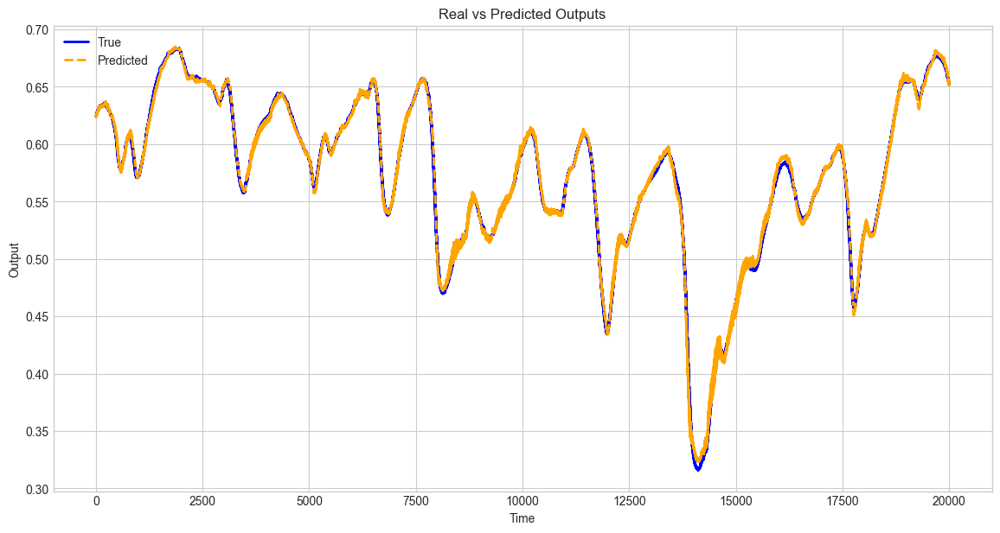

In [31]:
# # Example call to the function
# plot_preds_with_limit(
#     trainer=zeroshot_trainer, 
#     dataset=test_dataset, 
#     plot_dir=os.path.join(OUT_DIR, "ettm2"), 
#     plot_prefix="test_zeroshot", 
#     channel=0, 
#     limit=20000, 
#     amplification=1.0
# )

 ## Few-shot finetune and evaluation method

### Load model
Optionally, we can change some parameters of the model, e.g., dropout of the head.

In [251]:
finetune_forecast_model = TinyTimeMixerForPrediction.from_pretrained("ibm/TTM", revision=TTM_MODEL_REVISION, prediction_filter_length=forecast_length, loss='mse', head_dropout=0.7)
finetune_forecast_model

TinyTimeMixerForPrediction(
  (backbone): TinyTimeMixerModel(
    (encoder): TinyTimeMixerEncoder(
      (patcher): Linear(in_features=64, out_features=192, bias=True)
      (mlp_mixer_encoder): TinyTimeMixerBlock(
        (mixers): ModuleList(
          (0): TinyTimeMixerAdaptivePatchingBlock(
            (mixer_layers): ModuleList(
              (0-1): 2 x TinyTimeMixerLayer(
                (patch_mixer): PatchMixerBlock(
                  (norm): TinyTimeMixerNormLayer(
                    (norm): LayerNorm((48,), eps=1e-05, elementwise_affine=True)
                  )
                  (mlp): TinyTimeMixerMLP(
                    (fc1): Linear(in_features=32, out_features=64, bias=True)
                    (dropout1): Dropout(p=0.2, inplace=False)
                    (fc2): Linear(in_features=64, out_features=32, bias=True)
                    (dropout2): Dropout(p=0.2, inplace=False)
                  )
                  (gating_block): TinyTimeMixerGatedAttention(
              

### Frezze the TTM backbone

In [252]:
print(
        "Number of params before freezing backbone",
        count_parameters(finetune_forecast_model),
    )

# Freeze the backbone of the model
for param in finetune_forecast_model.backbone.parameters():
    param.requires_grad = False

# Count params
print(
    "Number of params after freezing the backbone",
    count_parameters(finetune_forecast_model),
)

Number of params before freezing backbone 805280
Number of params after freezing the backbone 289696


In [253]:
805280 - 289696

515584

In [254]:
print(count_parameters(finetune_forecast_model))
print(count_parameters(zeroshot_model))

289696
805280


### Finetune few-shot 5%

In [258]:
# Important parameters
learning_rate = 0.001
num_epochs = 50 # Ideally, we need more epochs (try offline preferably in a gpu for faster computation)
batch_size = 64

In [259]:
# Check if GPU is available and set the device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Move the model to the appropriate device
finetune_forecast_model.to(device)

print(f"Using learning rate = {learning_rate}")
finetune_forecast_args = TrainingArguments(
    output_dir=os.path.join(OUT_DIR, "output"),
    overwrite_output_dir=True,
    learning_rate=learning_rate,
    num_train_epochs=num_epochs,
    do_eval=True,
    evaluation_strategy="epoch",
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    dataloader_num_workers=0,
    report_to=None,
    save_strategy="epoch",
    logging_strategy="epoch",
    save_total_limit=1,
    logging_dir=os.path.join(OUT_DIR, "logs"),  # Make sure to specify a logging directory
    load_best_model_at_end=True,  # Load the best model when training ends
    metric_for_best_model="eval_loss",  # Metric to monitor for early stopping
    greater_is_better=False,  # For loss
    # Enable mixed precision training if a GPU is available
    fp16=torch.cuda.is_available(),
    # pin_memory=False  # Disable pin memory
)

# Create the early stopping callback
early_stopping_callback = EarlyStoppingCallback(
    early_stopping_patience=5,  # Number of epochs with no improvement after which to stop
    early_stopping_threshold=0.0,  # Minimum improvement required to consider as improvement
)
tracking_callback = TrackingCallback()

# Optimizer and scheduler
optimizer = AdamW(finetune_forecast_model.parameters(), lr=learning_rate)
scheduler = OneCycleLR(
    optimizer,
    learning_rate,
    epochs=num_epochs,
    steps_per_epoch=math.ceil(len(train_dataset) / (batch_size)),
)

finetune_forecast_trainer = Trainer(
    model=finetune_forecast_model,
    args=finetune_forecast_args,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    callbacks=[early_stopping_callback, tracking_callback],
    optimizers=(optimizer, scheduler),
)

Using device: cuda
Using learning rate = 0.001


In [260]:
# Fine tune
finetune_forecast_trainer.train()

  0%|          | 0/1562100 [00:00<?, ?it/s]

{'loss': 0.0001, 'grad_norm': 0.0026239072903990746, 'learning_rate': 5.048451359747656e-05, 'epoch': 1.0}


  0%|          | 0/3907 [00:00<?, ?it/s]

{'eval_loss': 9.934648005582858e-06, 'eval_runtime': 92.5111, 'eval_samples_per_second': 2702.378, 'eval_steps_per_second': 42.233, 'epoch': 1.0}
{'loss': 0.0001, 'grad_norm': 0.002329770941287279, 'learning_rate': 8.147479947791974e-05, 'epoch': 2.0}


  0%|          | 0/3907 [00:00<?, ?it/s]

{'eval_loss': 1.052598781825509e-05, 'eval_runtime': 92.8798, 'eval_samples_per_second': 2691.651, 'eval_steps_per_second': 42.065, 'epoch': 2.0}
{'loss': 0.0001, 'grad_norm': 0.0021809209138154984, 'learning_rate': 0.00013161548708621313, 'epoch': 3.0}


  0%|          | 0/3907 [00:00<?, ?it/s]

{'eval_loss': 1.1700927643687464e-05, 'eval_runtime': 89.4253, 'eval_samples_per_second': 2795.63, 'eval_steps_per_second': 43.69, 'epoch': 3.0}
{'loss': 0.0001, 'grad_norm': 0.0027147214859724045, 'learning_rate': 0.00019871991500219086, 'epoch': 4.0}


  0%|          | 0/3907 [00:00<?, ?it/s]

{'eval_loss': 1.0373762052040547e-05, 'eval_runtime': 92.7284, 'eval_samples_per_second': 2696.047, 'eval_steps_per_second': 42.134, 'epoch': 4.0}
{'loss': 0.0001, 'grad_norm': 0.0037970426492393017, 'learning_rate': 0.00027985882027840923, 'epoch': 5.0}


  0%|          | 0/3907 [00:00<?, ?it/s]

{'eval_loss': 1.5559815437882207e-05, 'eval_runtime': 92.9319, 'eval_samples_per_second': 2690.141, 'eval_steps_per_second': 42.042, 'epoch': 5.0}
{'loss': 0.0001, 'grad_norm': 0.0015247229021042585, 'learning_rate': 0.0003714741592902377, 'epoch': 6.0}


  0%|          | 0/3907 [00:00<?, ?it/s]

{'eval_loss': 1.5722047464805655e-05, 'eval_runtime': 88.6867, 'eval_samples_per_second': 2818.913, 'eval_steps_per_second': 44.054, 'epoch': 6.0}
{'train_runtime': 8083.332, 'train_samples_per_second': 12367.969, 'train_steps_per_second': 193.25, 'train_loss': 7.392166951217377e-05, 'epoch': 6.0}
[TrackingCallback] Mean Epoch Time = 1255.6000728209813 seconds, Total Train Time = 8083.333215713501


TrainOutput(global_step=187452, training_loss=7.392166951217377e-05, metrics={'train_runtime': 8083.332, 'train_samples_per_second': 12367.969, 'train_steps_per_second': 193.25, 'total_flos': 2.967824234446848e+16, 'train_loss': 7.392166951217377e-05, 'epoch': 6.0})

In [261]:
print(zeroshot_trainer.evaluate(test_dataset))
finetune_forecast_trainer.evaluate(test_dataset)

  0%|          | 0/3907 [00:00<?, ?it/s]

{'eval_loss': 1.3371668501349632e-05, 'eval_runtime': 93.9585, 'eval_samples_per_second': 2660.749, 'eval_steps_per_second': 41.582}


  0%|          | 0/3907 [00:00<?, ?it/s]

{'eval_loss': 8.808432539808564e-06,
 'eval_runtime': 92.7505,
 'eval_samples_per_second': 2695.402,
 'eval_steps_per_second': 42.124,
 'epoch': 6.0}

ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 0 dimension(s)

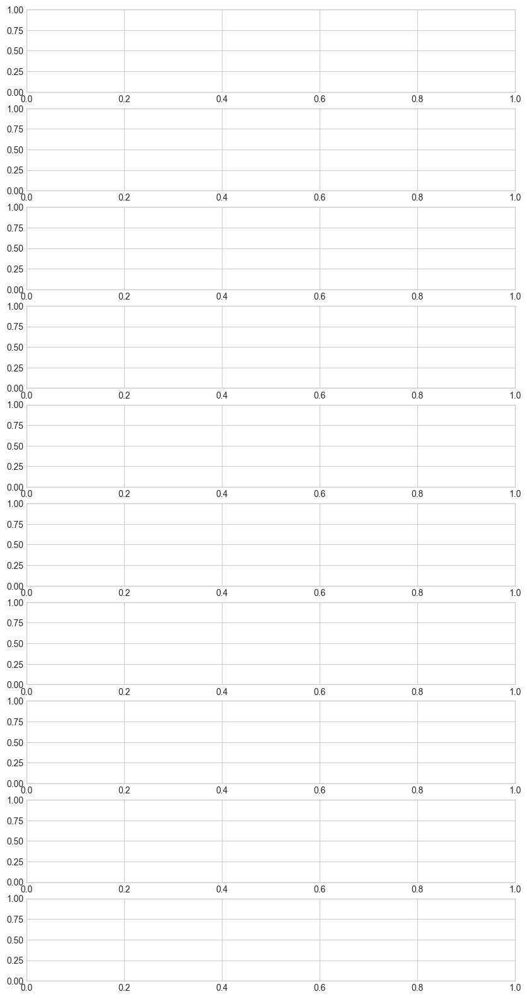

In [263]:
plot_preds(trainer=finetune_forecast_trainer, dset=train_dataset, plot_dir=os.path.join(OUT_DIR, "ettm2"), plot_prefix="test_zeroshot", channel=0)

In [99]:
test_dataset[0]

{'past_values': tensor([[0.4917],
         [0.4916],
         [0.4919],
         [0.4915],
         [0.4914],
         [0.4913],
         [0.4910],
         [0.4909],
         [0.4912],
         [0.4908],
         [0.4906],
         [0.4909],
         [0.4911],
         [0.4909],
         [0.4906],
         [0.4904],
         [0.4901],
         [0.4895],
         [0.4896],
         [0.4902],
         [0.4904],
         [0.4904],
         [0.4905],
         [0.4902],
         [0.4902],
         [0.4898],
         [0.4904],
         [0.4902],
         [0.4901],
         [0.4903],
         [0.4914],
         [0.4923],
         [0.4923],
         [0.4917],
         [0.4919],
         [0.4922],
         [0.4924],
         [0.4925],
         [0.4934],
         [0.4942],
         [0.4947],
         [0.4952],
         [0.4954],
         [0.4958],
         [0.4961],
         [0.4963],
         [0.4958],
         [0.4975],
         [0.4992],
         [0.4997],
         [0.5000],
         [0.5004

In [264]:
start_index = 0
end_index = 20000

true_values_fine, predicted_values_fine = calculate_predictions(
    trainer=finetune_forecast_trainer, 
    dataset=test_dataset, 
    start=start_index, 
    end=end_index, 
    amplification=1.0
)

100%|██████████| 20000/20000 [03:42<00:00, 90.09it/s] 


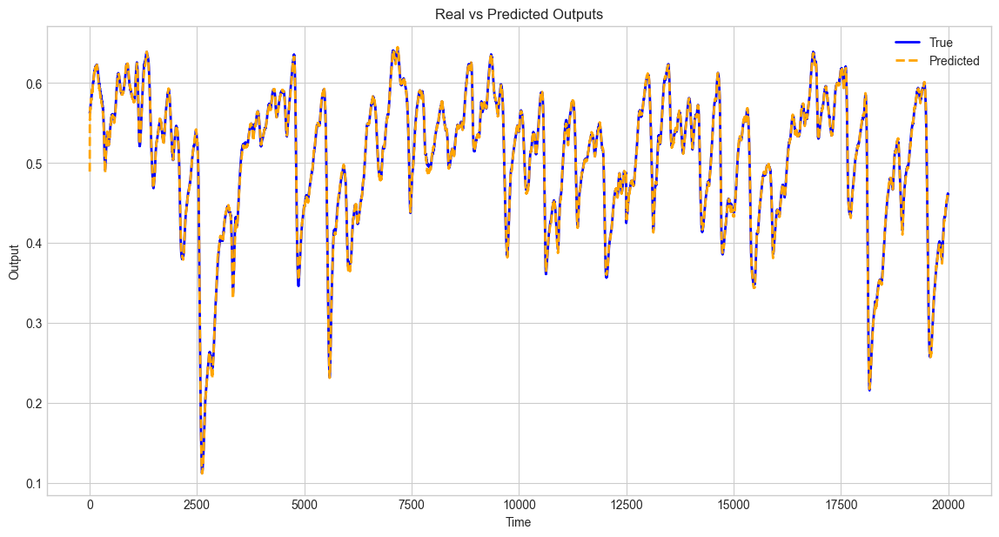

In [265]:
plot_predictions(
    true_values=true_values_fine, 
    predicted_values=predicted_values_fine, 
    plot_dir=os.path.join(OUT_DIR, "ettm2"), 
    plot_prefix="test_finetuned", 
    channel=0, 
    start=start_index, 
    end=end_index
)


In [266]:
plot_predictions_plotly(
    true_values=true_values_fine, 
    predicted_values=predicted_values_fine, 
    plot_dir=os.path.join(OUT_DIR, "ettm2"), 
    plot_prefix="test_finetuned", 
    channel=0, 
    start=0, 
    end=20000
)

In [267]:
torch.save(finetune_forecast_model, r"C:\Users\Noor1\Documents\omar\forecast\output\ttm\models\finetune_forecast_model_data_2M_.pt")

In [270]:
# reload model from torch.save file
finetune_model_load = torch.load(r"C:\Users\Noor1\Documents\omar\forecast\output\ttm\models\finetune_forecast_model_data_2M_.pt")

finetune_forecast_trainer = Trainer(
    model=finetune_forecast_model,
    args=finetune_forecast_args,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    callbacks=[early_stopping_callback, tracking_callback],
    optimizers=(optimizer, scheduler),
)

In [230]:
start_index = 990000
end_index = 1000000


In [271]:

true_values_fine, predicted_values_fine = calculate_predictions(
    trainer=finetune_forecast_trainer, 
    dataset=full_dataset, 
    start=start_index, 
    end=end_index, 
    amplification=1.0
)

100%|██████████| 20000/20000 [03:21<00:00, 99.33it/s]


In [272]:
true_values_fine.shape, predicted_values_fine.shape

((20000, 1), (20000, 1))

In [233]:
# save the true_values_fine and predicted_values_fine as csv file
# np.savetxt('true_values_Transformer_finetuned.csv', true_values_fine, delimiter=',')
# np.savetxt('predicted_values_Transformer_finetuned.csv', predicted_values_fine, delimiter=',')

# combine the true_values and predicted_values into a single dataframe
true_values_fine = true_values_fine.flatten()  # For NumPy arrays
predicted_values_fine = predicted_values_fine.flatten()  # For NumPy arrays
df_down = pd.DataFrame({'true_values': true_values_fine, 'predicted_values': predicted_values_fine})
df_down.to_csv('fewshot_true_vs_predicted_10kV2.csv', index=False)

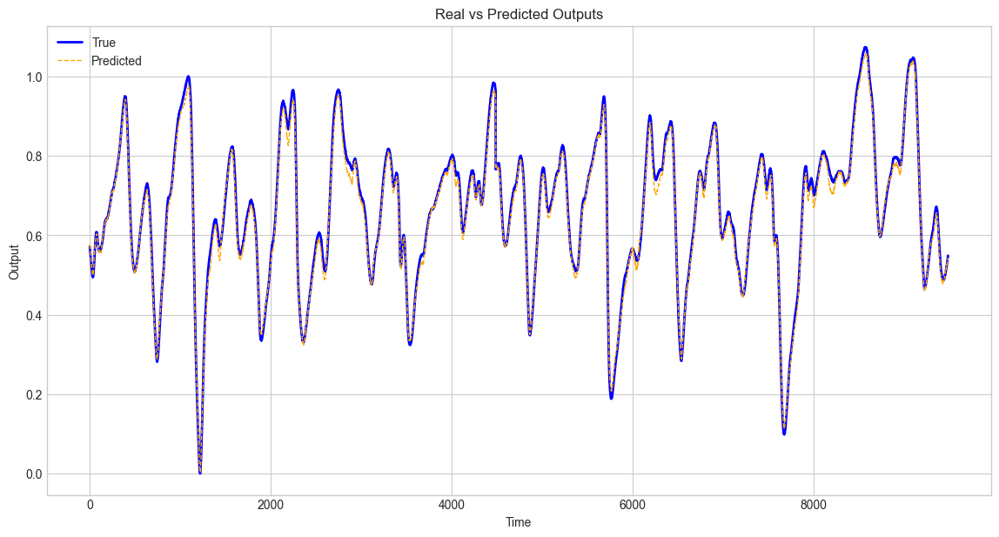

In [234]:
plot_predictions(
    true_values=true_values_fine, 
    predicted_values=predicted_values_fine, 
    plot_dir=os.path.join(OUT_DIR, "ettm2"), 
    plot_prefix="test_finetuned", 
    channel=0, 
    start=start_index, 
    end=end_index
)

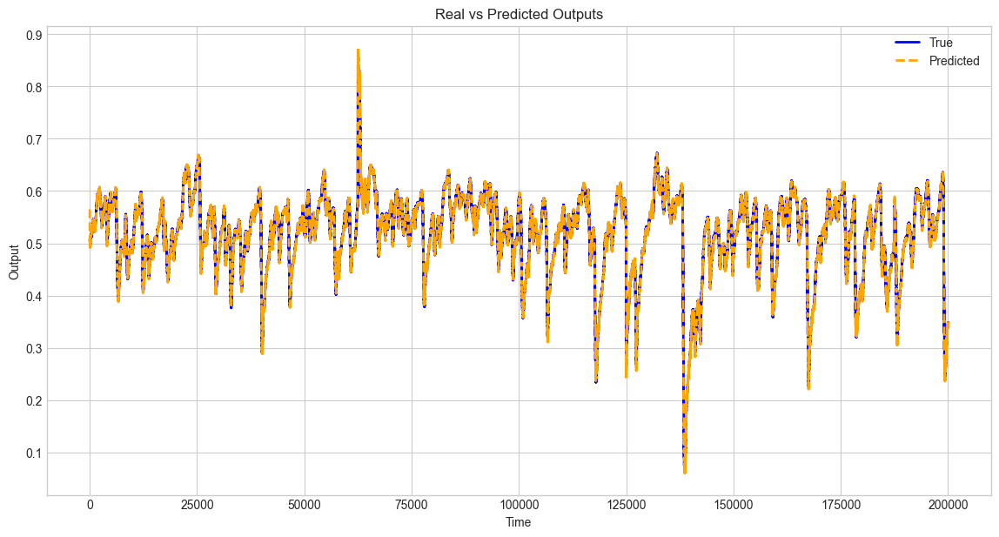

In [104]:
plot_predictions(
    true_values=true_values_fine, 
    predicted_values=predicted_values_fine, 
    plot_dir=os.path.join(OUT_DIR, "ettm2"), 
    plot_prefix="test_finetuned", 
    channel=0, 
    start=start_index, 
    end=end_index
)


In [105]:
plot_predictions_plotly(
    true_values=true_values_fine, 
    predicted_values=predicted_values_fine, 
    plot_dir=os.path.join(OUT_DIR, "ettm2"), 
    plot_prefix="test_finetuned", 
    channel=0, 
    start=0, 
    end=200000
)

## Hands-on Questions

### Q 15.	Zero-shot on etth1.
In your notebook, modify the zero-shot code to try it on etth1 dataset. Etth1 is available on https://raw.githubusercontent.com/zhouhaoyi/ETDataset/main/ETT-small/ETTh1.csv.
Use the following train/val/test splits:
```
split_config = {
                "train": [0, 12 * 30 * 24],
                "valid": [12 * 30 * 24, 12 * 30 * 24 + 4 * 30 * 24],
                "test": [
                    12 * 30 * 24 + 4 * 30 * 24,
                    12 * 30 * 24 + 8 * 30 * 24,
                ],
            }
```

### Q 16.	Zero-shot on etth1 by truncating the length
Let’s say your application needs to forecast 24 hours in the future. You can still use the 512-96 TTM model and set `prediction_filter_length=24` argument during model loading. Try it on etth1, and note the evaluation error (on all channels)?

### Q 17.	Few-shot on etth1
Try few-shot 5% forecasting on etth1. Freeze the backbone and fine-tune for only 1 epoch. What is the evaluation error you get?

### Q 18.	Few-shot on etth1 by changing loss function
Try few-shot 5% forecasting on etth1 by changing the `loss` to `mae` (mean absolute error). Freeze the backbone and fine-tune for only 1 epoch. What is the evaluation error you get?

### Q 19.	Zero-shot on channel 0 and 2 for etth1
In your notebook, add `prediction_channel_indices=[0,2]` during model loading to forecast only 0th and 2nd channels. In this case, execute the following code and note the output shape.
```
zeroshot_model = TinyTimeMixerForPrediction.from_pretrained("ibm/TTM", revision=TTM_MODEL_REVISION, prediction_channel_indices=[0,2])
output = zeroshot_model.forward(test_dataset[0]['past_values'].unsqueeze(0), return_loss=False)
output.prediction_outputs.shape
```